In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
import shutil
import os
import sys
from PIL import Image
from tqdm import tqdm
%matplotlib inline
from skimage.filters import sobel
import cv2

In [2]:
import os
import shutil

working_dir = "/kaggle/working"

for item in os.listdir(working_dir):
    item_path = os.path.join(working_dir, item)
    try:
        if os.path.isdir(item_path):
            shutil.rmtree(item_path)
        else:
            os.remove(item_path)
        print(f"Deleted: {item_path}")
    except Exception as e:
        print(f"Error deleting {item_path}: {e}")


Deleted: /kaggle/working/.virtual_documents


In [3]:
import os
import random
import shutil
from tqdm import tqdm

source_root = "/kaggle/input/multilingual-fake-news-images-bn-en/images_data/"
dest_root = "/kaggle/working/selected_images"

folders_to_copy = {
    "real/bn": 7000,
    "real/en": 7000,
    "fake/bn": 7000,
    "fake/en": 7000
}

def collect_images(src_dir, max_images):
    if not os.path.exists(src_dir):
        print(f"Directory does not exist: {src_dir}")
        return []
    
    image_paths = []
    for root, _, files in os.walk(src_dir):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths.append(os.path.join(root, f))
    
    print(f"Found {len(image_paths)} images in {src_dir}")
    
    selected_images = random.sample(image_paths, min(max_images, len(image_paths))) if image_paths else []
    print(f"Selected {len(selected_images)} images for copying from {src_dir}")
    
    return selected_images

for rel_path, max_images in folders_to_copy.items():
    src_path = os.path.join(source_root, rel_path)
    dst_path = os.path.join(dest_root, rel_path)
    
    os.makedirs(dst_path, exist_ok=True)
    
    image_list = collect_images(src_path, max_images)
    
    if not image_list:
        print(f"No images found for {rel_path}")
        continue
    
    print(f"Copying {len(image_list)} images for {rel_path}")
    for src_img in tqdm(image_list, desc=rel_path, total=len(image_list)):
        try:
            rel_img_path = os.path.relpath(src_img, src_path)
            dst_img = os.path.join(dst_path, rel_img_path)
            os.makedirs(os.path.dirname(dst_img), exist_ok=True)
            shutil.copy2(src_img, dst_img)
        except Exception as e:
            print(f"Error copying {src_img}: {e}")

Found 50728 images in /kaggle/input/multilingual-fake-news-images-bn-en/images_data/real/bn
Selected 7000 images for copying from /kaggle/input/multilingual-fake-news-images-bn-en/images_data/real/bn
Copying 7000 images for real/bn


real/bn: 100%|██████████| 7000/7000 [00:44<00:00, 158.75it/s]


Found 78987 images in /kaggle/input/multilingual-fake-news-images-bn-en/images_data/real/en
Selected 7000 images for copying from /kaggle/input/multilingual-fake-news-images-bn-en/images_data/real/en
Copying 7000 images for real/en


real/en: 100%|██████████| 7000/7000 [00:41<00:00, 168.96it/s]


Found 55684 images in /kaggle/input/multilingual-fake-news-images-bn-en/images_data/fake/bn
Selected 7000 images for copying from /kaggle/input/multilingual-fake-news-images-bn-en/images_data/fake/bn
Copying 7000 images for fake/bn


fake/bn: 100%|██████████| 7000/7000 [00:40<00:00, 174.82it/s]


Found 62317 images in /kaggle/input/multilingual-fake-news-images-bn-en/images_data/fake/en
Selected 7000 images for copying from /kaggle/input/multilingual-fake-news-images-bn-en/images_data/fake/en
Copying 7000 images for fake/en


fake/en: 100%|██████████| 7000/7000 [00:42<00:00, 166.59it/s]


In [4]:
base_dir = "/kaggle/working/selected_images"

# Collect all image file paths
image_files = []
for root, _, files in os.walk(base_dir):
    for file in files:
        if file.lower().endswith((".jpg", ".jpeg", ".png")):
            image_files.append(os.path.join(root, file))

print(f"Total images found: {len(image_files)}")

# Check and delete unreadable images with progress bar
deleted_count = 0
for img_path in tqdm(image_files, desc="Checking images", ncols=100):
    img = cv2.imread(img_path, cv2.IMREAD_UNCHANGED)
    if img is None:
        os.remove(img_path)
        deleted_count += 1

print(f"Deleted {deleted_count} invalid/unreadable images.")

Total images found: 28000


Checking images:   0%|                                            | 8/28000 [00:00<06:16, 74.29it/s]libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
Checking images:   0%|                                          | 45/28000 [00:00<02:01, 230.57it/s]libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile
Checking images:  12%|████▊                                   | 3358/28000 [00:18<03:28, 118.26it/s]libpng error: Read Error
libpng warning: iCCP: known incorrect sRGB profile
Checking ima

Deleted 2586 invalid/unreadable images.


In [5]:
shutil.make_archive("/kaggle/working/selected_images", 'zip', "/kaggle/working/selected_images")

'/kaggle/working/selected_images.zip'

Scanning real/bn: 42it [00:00, 2240.23it/s]


Found 6602 images in real/bn


Scanning real/en: 63it [00:00, 3384.58it/s]


Found 6416 images in real/en


Scanning fake/bn: 33it [00:00, 2250.60it/s]


Found 6130 images in fake/bn


Scanning fake/en: 36it [00:00, 2467.32it/s]


Found 6266 images in fake/en


Grid for fake/en: 100%|██████████| 6/6 [00:00<00:00, 40.70it/s]


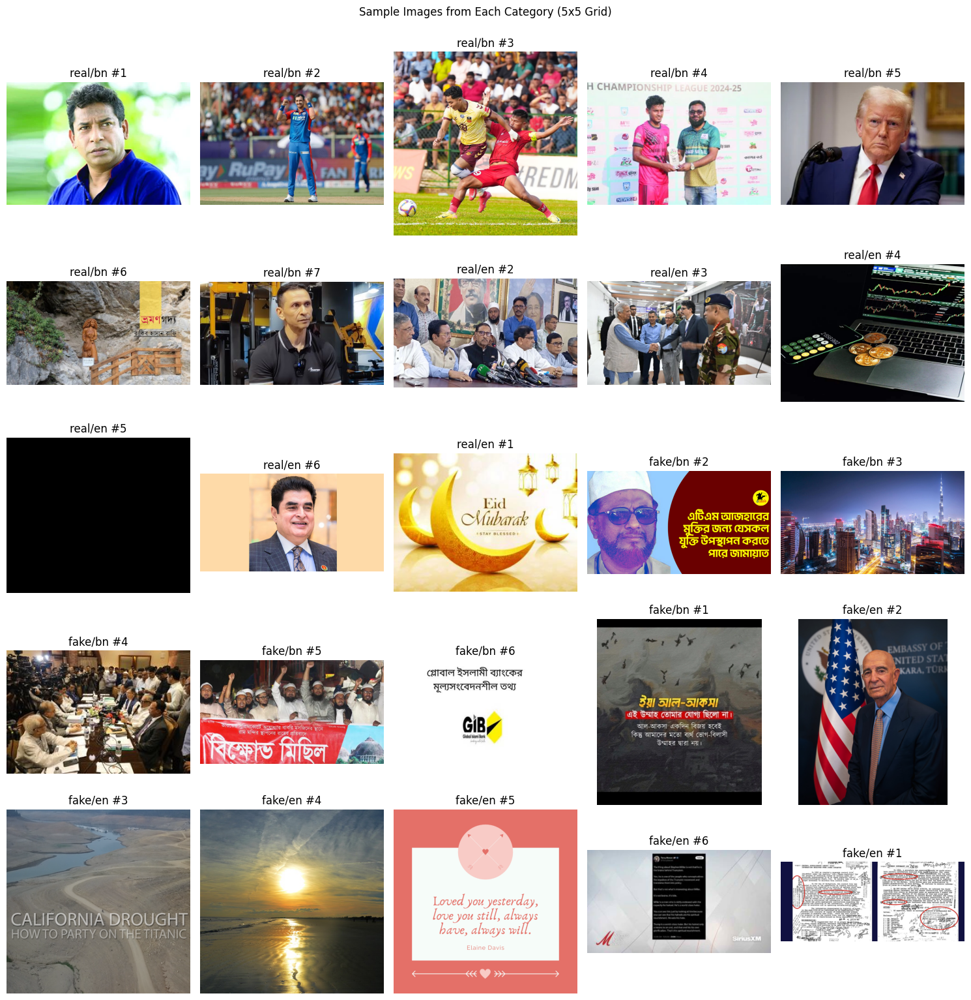

In [6]:
root_dir="/kaggle/working/selected_images"

# Define categories and their paths
categories = {
    "real/bn": os.path.join(root_dir, "real/bn"),
    "real/en": os.path.join(root_dir, "real/en"),
    "fake/bn": os.path.join(root_dir, "fake/bn"),
    "fake/en": os.path.join(root_dir, "fake/en")
}

# Collect all image paths
image_paths = {}
for cat, path in categories.items():
    image_paths[cat] = []
    for root, _, files in tqdm(os.walk(path), desc=f"Scanning {cat}"):
        for f in files:
            if f.lower().endswith(('.jpg', '.jpeg', '.png')):
                image_paths[cat].append(os.path.join(root, f))
    print(f"Found {len(image_paths[cat])} images in {cat}")

# 1. Image Grid: Display 5x5 grid (25 images total, distributed across categories)
plt.figure(figsize=(15, 15))
total_images = 25  # 5x5 grid
images_per_cat = [7, 6, 6, 6]  # Distribute 25 images across 4 categories
img_count = 0
for i, (cat, paths) in enumerate(image_paths.items()):
    if not paths:
        continue
    num_images = images_per_cat[i] if i < len(images_per_cat) else 0
    sample_paths = random.sample(paths, min(num_images, len(paths)))
    for img_path in tqdm(sample_paths, desc=f"Grid for {cat}"):
        try:
            img = Image.open(img_path).convert('RGB')
            plt.subplot(5, 5, img_count + 1)
            plt.imshow(img)
            plt.title(f"{cat} #{img_count % num_images + 1}")
            plt.axis('off')
            img_count += 1
        except Exception as e:
            print(f"Error reading {img_path}: {e}")
plt.tight_layout()
plt.suptitle("Sample Images from Each Category (5x5 Grid)", y=1.02)
plt.show()


Scanning real/bn: 42it [00:00, 2533.23it/s]


Found 6602 images in real/bn


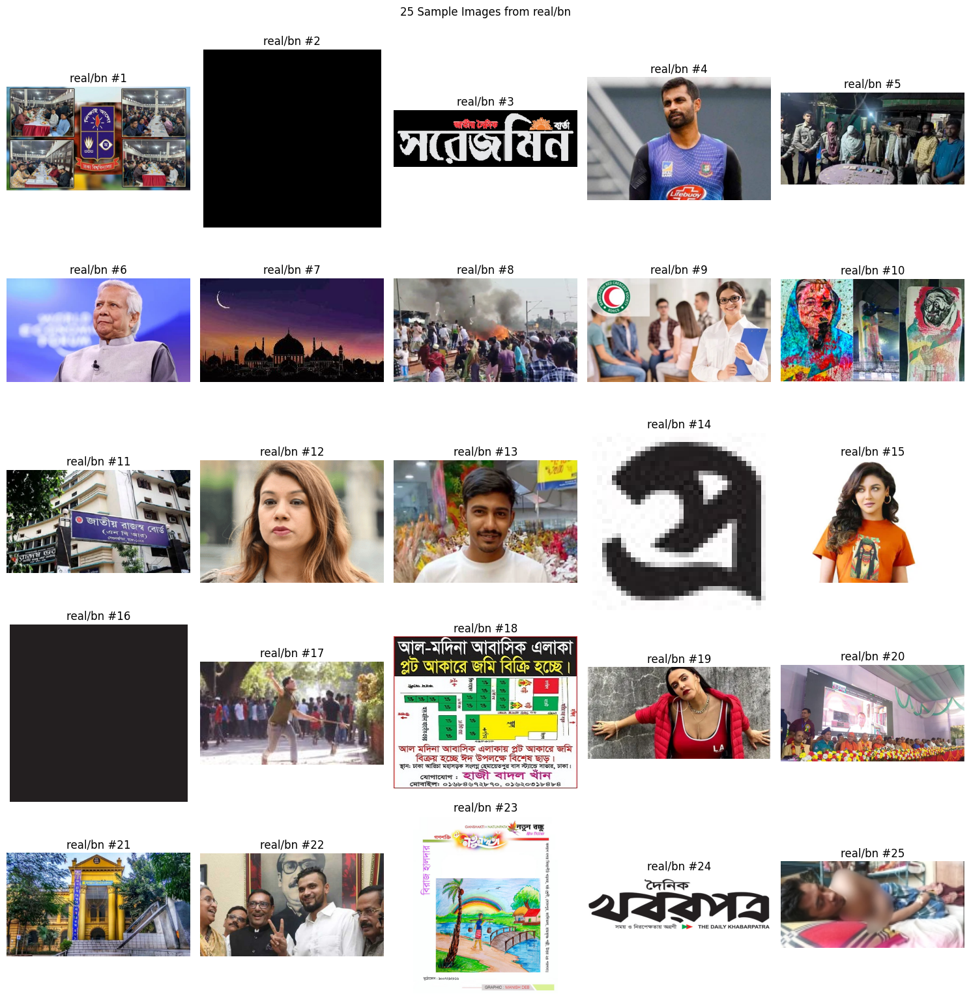

In [7]:
category_path = "/kaggle/working/selected_images/real/bn"

# Collect image paths
image_paths = []
for root, _, files in tqdm(os.walk(category_path), desc="Scanning real/bn"):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, f))

print(f"Found {len(image_paths)} images in real/bn")

# Display 5x5 grid (25 images)
plt.figure(figsize=(15, 15))
sample_paths = random.sample(image_paths, min(25, len(image_paths)))

for idx, img_path in enumerate(sample_paths):
    try:
        img = Image.open(img_path).convert('RGB')
        plt.subplot(5, 5, idx + 1)
        plt.imshow(img)
        plt.title(f"real/bn #{idx+1}")
        plt.axis('off')
    except Exception as e:
        print(f"Error reading {img_path}: {e}")

plt.tight_layout()
plt.suptitle("25 Sample Images from real/bn", y=1.02)
plt.show()

Plotting fake/bn grid: 100%|██████████| 25/25 [00:00<00:00, 56.92it/s]


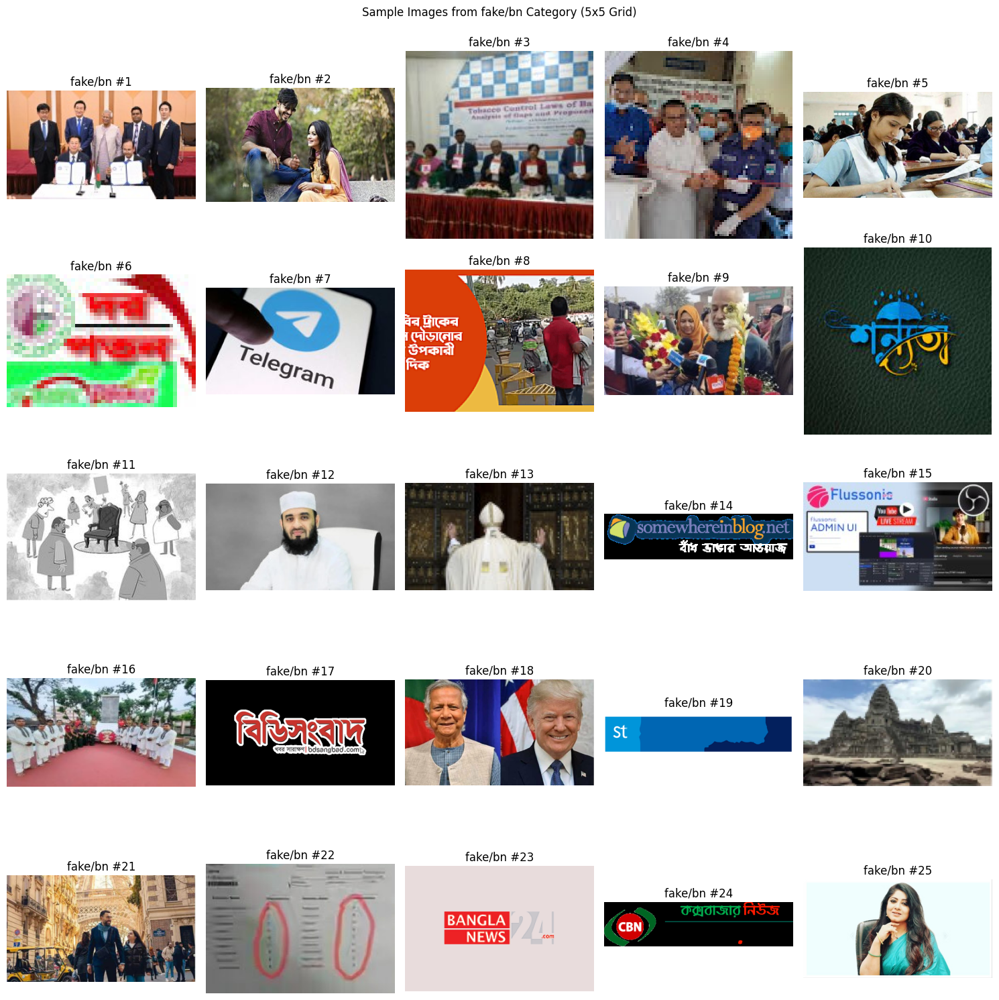

In [8]:
target_dir = "/kaggle/working/selected_images/fake/bn"

# Collect image paths
image_paths = []
for root, _, files in os.walk(target_dir):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, f))

# Sample 25 images (or less if not enough)
sample_paths = random.sample(image_paths, min(25, len(image_paths)))

# Plot 5x5 grid
plt.figure(figsize=(15, 15))
for idx, img_path in enumerate(tqdm(sample_paths, desc="Plotting fake/bn grid")):
    try:
        img = Image.open(img_path).convert('RGB')
        plt.subplot(5, 5, idx + 1)
        plt.imshow(img)
        plt.title(f"fake/bn #{idx + 1}")
        plt.axis('off')
    except Exception as e:
        print(f"Error loading {img_path}: {e}")
plt.tight_layout()
plt.suptitle("Sample Images from fake/bn Category (5x5 Grid)", y=1.02)
plt.show()

Plotting real/en grid: 100%|██████████| 25/25 [00:00<00:00, 36.03it/s]


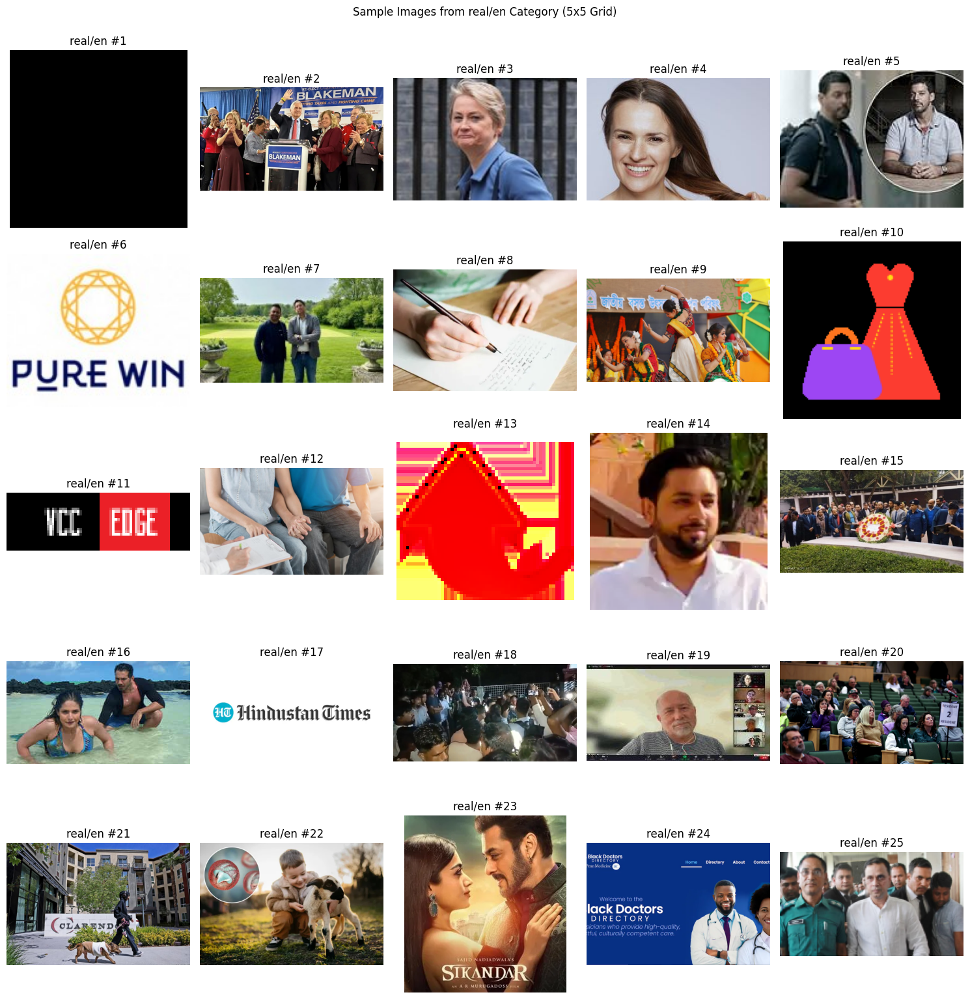

In [9]:
# Define the path to the real/en category
target_dir = "/kaggle/working/selected_images/real/en"

# Collect image paths
image_paths = []
for root, _, files in os.walk(target_dir):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, f))

# Sample 25 images (or fewer if not enough)
sample_paths = random.sample(image_paths, min(25, len(image_paths)))

# Plot 5x5 grid
plt.figure(figsize=(15, 15))
for idx, img_path in enumerate(tqdm(sample_paths, desc="Plotting real/en grid")):
    try:
        img = Image.open(img_path).convert('RGB')
        plt.subplot(5, 5, idx + 1)
        plt.imshow(img)
        plt.title(f"real/en #{idx + 1}")
        plt.axis('off')
    except Exception as e:
        print(f"Error loading {img_path}: {e}")
plt.tight_layout()
plt.suptitle("Sample Images from real/en Category (5x5 Grid)", y=1.02)
plt.show()

Plotting fake/en grid:  36%|███▌      | 9/25 [00:00<00:00, 39.95it/s]/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Plotting fake/en grid: 100%|██████████| 25/25 [00:00<00:00, 35.52it/s]


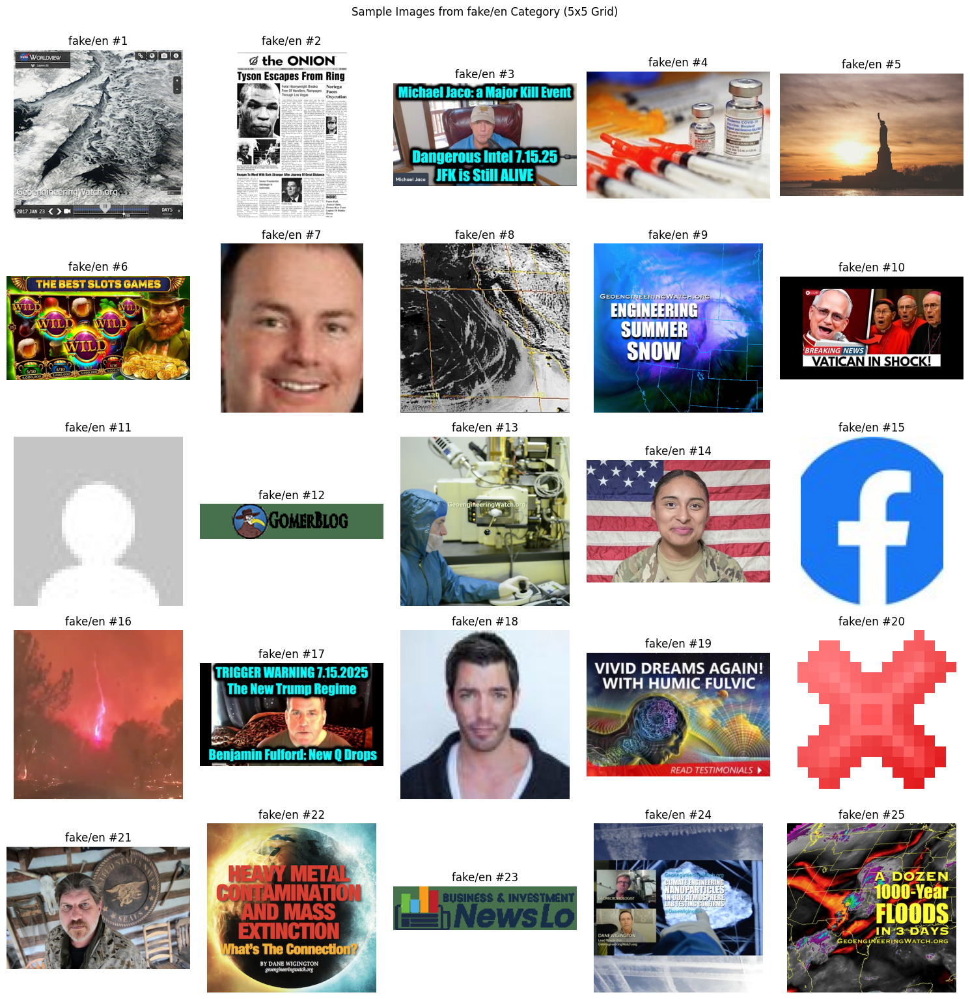

In [10]:
# Define the path to the fake/en category
target_dir = "/kaggle/working/selected_images/fake/en"

# Collect image paths
image_paths = []
for root, _, files in os.walk(target_dir):
    for f in files:
        if f.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_paths.append(os.path.join(root, f))

# Sample 25 images (or fewer if not enough)
sample_paths = random.sample(image_paths, min(25, len(image_paths)))

# Plot 5x5 grid
plt.figure(figsize=(15, 15))
for idx, img_path in enumerate(tqdm(sample_paths, desc="Plotting fake/en grid")):
    try:
        img = Image.open(img_path).convert('RGB')
        plt.subplot(5, 5, idx + 1)
        plt.imshow(img)
        plt.title(f"fake/en #{idx + 1}")
        plt.axis('off')
    except Exception as e:
        print(f"Error loading {img_path}: {e}")
plt.tight_layout()
plt.suptitle("Sample Images from fake/en Category (5x5 Grid)", y=1.02)
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


<function matplotlib.pyplot.show(close=None, block=None)>

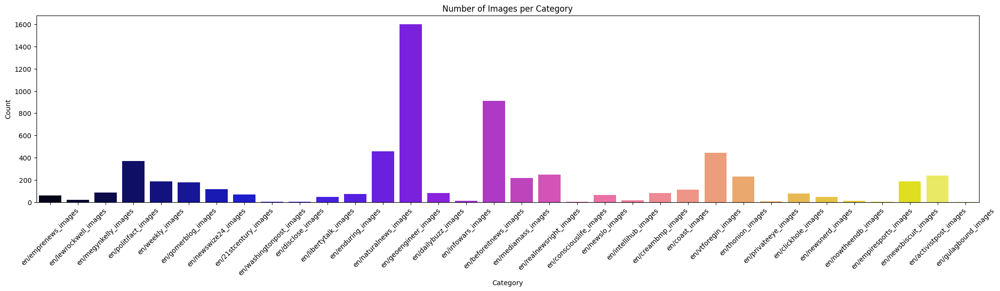

In [11]:
from collections import defaultdict

category_counts = defaultdict(int)
for path in image_paths:
    category = "/".join(path.split("/")[-3:-1])  # e.g., "fake/en"
    category_counts[category] += 1

# Plot
plt.figure(figsize=(25, 5))
sns.barplot(x=list(category_counts.keys()), y=list(category_counts.values()), palette="gnuplot2")
plt.title("Number of Images per Category")
plt.xlabel("Category")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.show

Analyzing image sizes: 100%|██████████| 100/100 [00:00<00:00, 4035.47it/s]
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


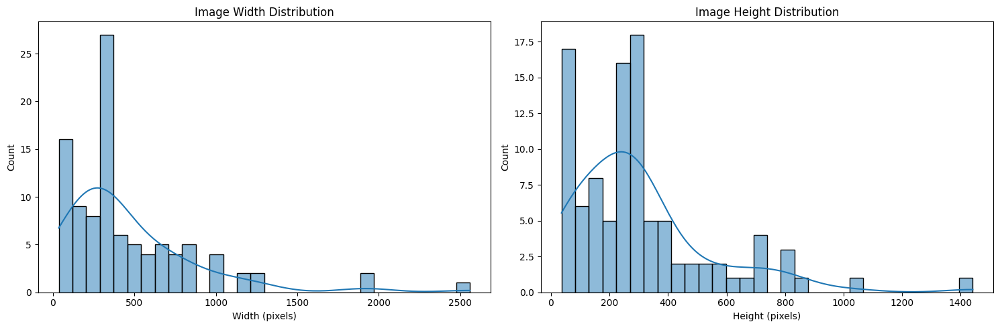

In [12]:
widths, heights = [], []

# Take a sample (up to 100 images)
sample_paths = random.sample(image_paths, min(100, len(image_paths)))

for img_path in tqdm(sample_paths, desc="Analyzing image sizes"):
    try:
        img = Image.open(img_path)
        w, h = img.size
        widths.append(w)
        heights.append(h)
    except Exception as e:
        print(f"Error reading {img_path}: {e}")

# Plotting
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.histplot(widths, bins=30, kde=True)
plt.title("Image Width Distribution")
plt.xlabel("Width (pixels)")

plt.subplot(1, 2, 2)
sns.histplot(heights, bins=30, kde=True)
plt.title("Image Height Distribution")
plt.xlabel("Height (pixels)")

plt.tight_layout()
plt.show()


Aspect ratio: 100%|██████████| 100/100 [00:00<00:00, 5526.75it/s]
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


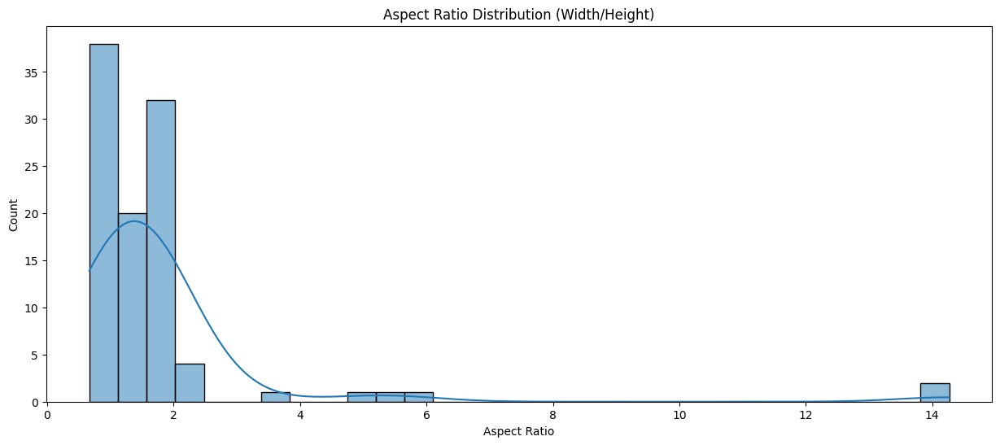

In [13]:
aspect_ratios = []

sample_paths = random.sample(image_paths, min(100, len(image_paths)))
for img_path in tqdm(sample_paths, desc="Aspect ratio"):
    try:
        img = Image.open(img_path)
        w, h = img.size
        aspect_ratios.append(w / h)
    except Exception as e:
        print(f"Error reading {img_path}: {e}")

plt.figure(figsize=(15, 6))
sns.histplot(aspect_ratios, bins=30, kde=True)
plt.title("Aspect Ratio Distribution (Width/Height)")
plt.xlabel("Aspect Ratio")
plt.show()


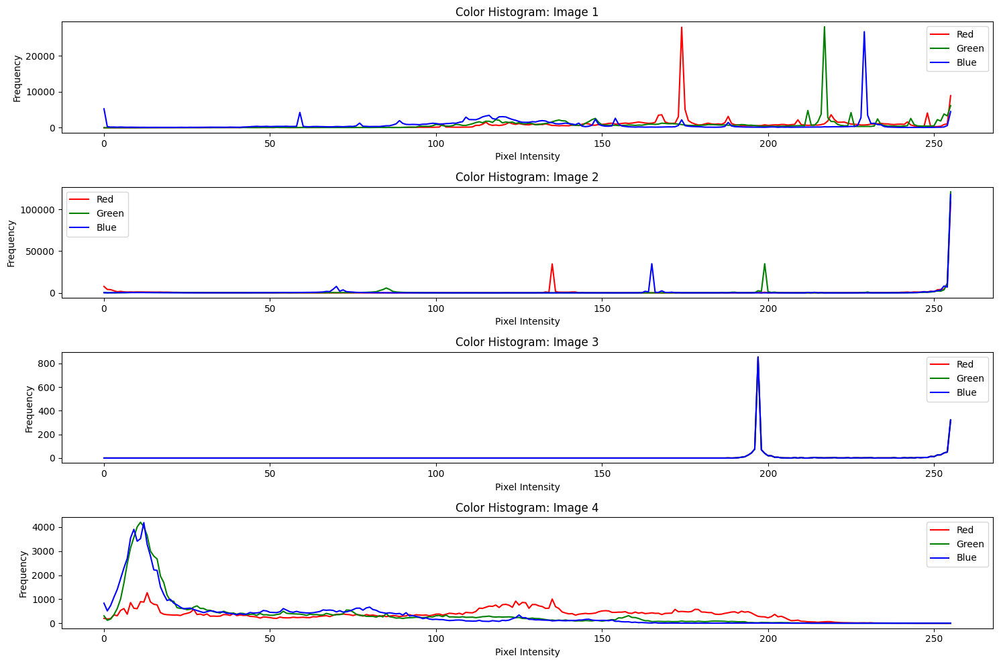

In [14]:
plt.figure(figsize=(15, 10))

sample_paths = random.sample(image_paths, min(4, len(image_paths)))

for i, img_path in enumerate(sample_paths):
    img = cv2.imread(img_path)
    if img is None:
        print(f"Failed to load {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.subplot(4, 1, i + 1)
    for j, color in enumerate(['red', 'green', 'blue']):
        hist = cv2.calcHist([img], [j], None, [256], [0, 256])
        plt.plot(hist, color=color, label=color.capitalize())
    
    plt.title(f"Color Histogram: Image {i + 1}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.legend()

plt.tight_layout()
plt.show()


Calculating file sizes: 100%|██████████| 500/500 [00:00<00:00, 138810.70it/s]
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


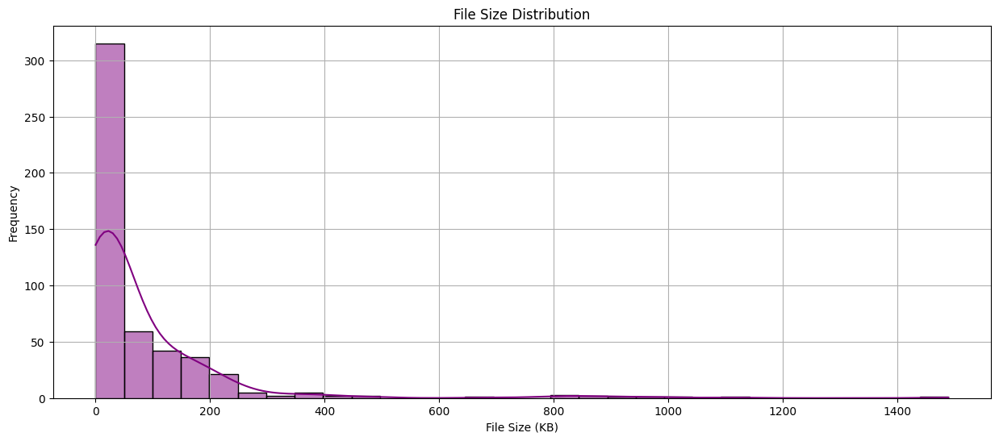

In [15]:
file_sizes = []

sample_paths = random.sample(image_paths, min(500, len(image_paths)))  # Sample max 500 images
for img_path in tqdm(sample_paths, desc="Calculating file sizes"):
    try:
        file_sizes.append(os.path.getsize(img_path) / 1024)  # in KB
    except Exception as e:
        print(f"Error with file {img_path}: {e}")

plt.figure(figsize=(15, 6))
sns.histplot(file_sizes, bins=30, kde=True, color='purple')
plt.title("File Size Distribution")
plt.xlabel("File Size (KB)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

Calculating Brightness: 100%|██████████| 500/500 [00:02<00:00, 232.31it/s]
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


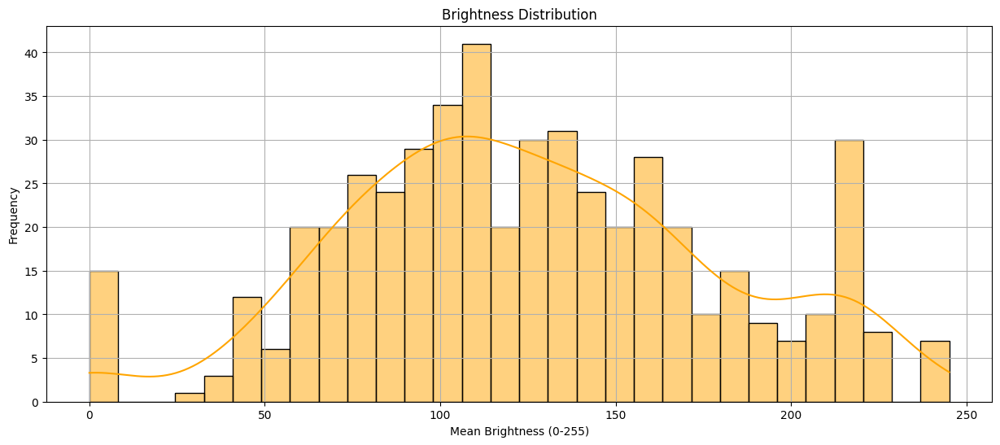

In [16]:
random.seed(42)

brightness_values = []

sample_paths = random.sample(image_paths, min(500, len(image_paths)))  # Sample max 500 images
for img_path in tqdm(sample_paths, desc="Calculating Brightness"):
    try:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            brightness_values.append(np.mean(img))
    except Exception as e:
        print(f"Error reading {img_path}: {e}")

plt.figure(figsize=(15, 6))
sns.histplot(brightness_values, bins=30, kde=True, color='orange')
plt.title("Brightness Distribution")
plt.xlabel("Mean Brightness (0-255)")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

Counting image formats: 100%|██████████| 6266/6266 [00:00<00:00, 647822.45it/s]


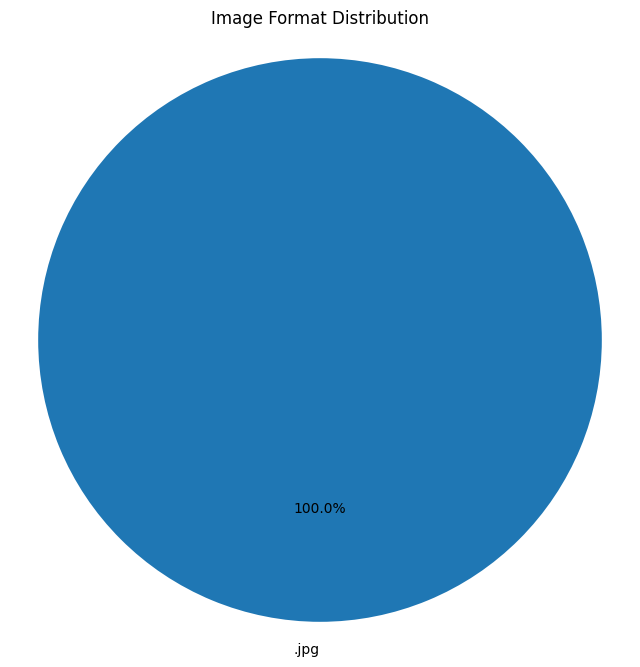

In [17]:

formats = defaultdict(int)

for img_path in tqdm(image_paths, desc="Counting image formats"):
    ext = os.path.splitext(img_path)[1].lower()
    formats[ext] += 1

plt.figure(figsize=(8, 8))
plt.pie(formats.values(), labels=formats.keys(), autopct='%1.1f%%', startangle=90)
plt.title("Image Format Distribution")
plt.axis("equal")  # Equal aspect ratio ensures pie chart is circular.
plt.show()

Loading images:  36%|███▌      | 9/25 [00:00<00:00, 73.70it/s]/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Loading images: 100%|██████████| 25/25 [00:00<00:00, 106.90it/s]


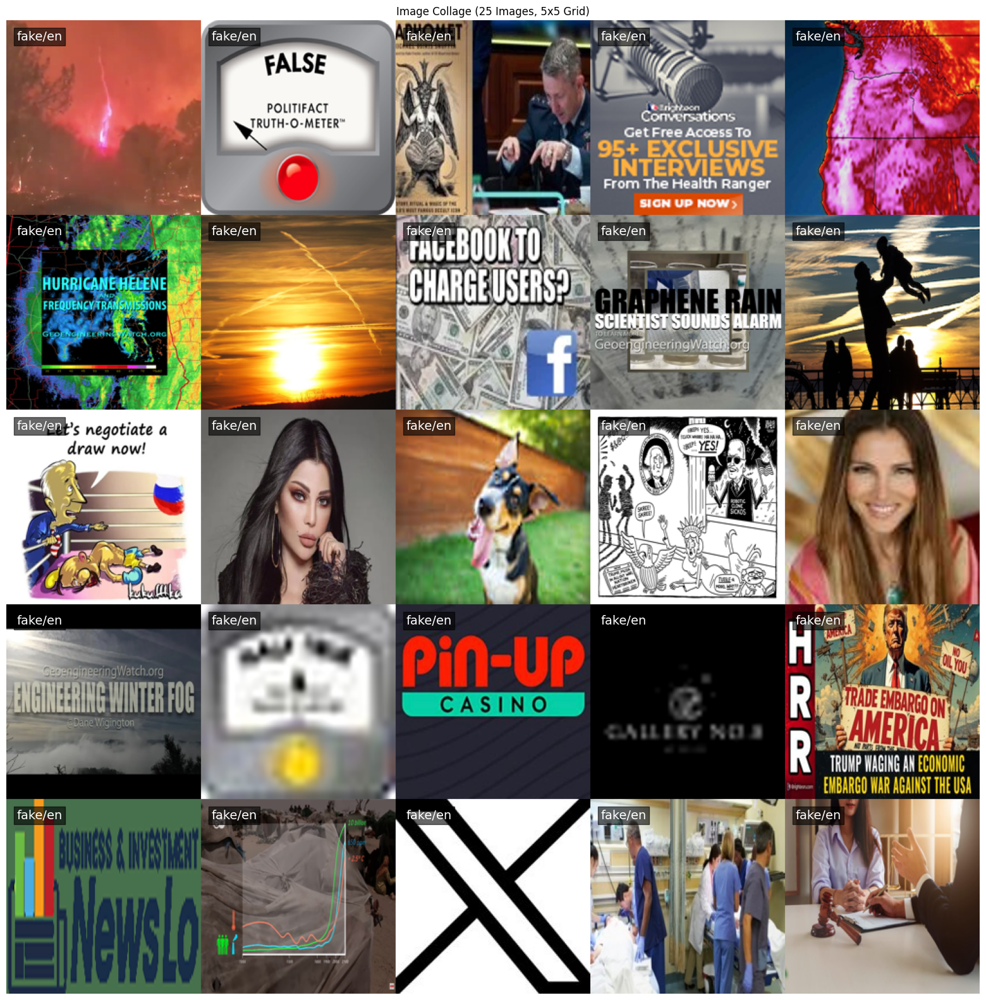

In [18]:
# Collect all image paths grouped by category
cat_to_paths = {}
for path in image_paths:
    parts = path.split(os.sep)
    try:
        cat = parts[-4]
        lang = parts[-3]
    except IndexError:
        cat = 'unknown'
        lang = 'unknown'
    key = f"{cat}/{lang}"
    cat_to_paths.setdefault(key, []).append(path)

# Flatten all image paths from all categories
all_paths = []
all_labels = []
for cat, paths in cat_to_paths.items():
    all_paths.extend(paths)
    all_labels.extend([cat] * len(paths))

# Sample exactly 25 images randomly from all available images
sample_size = min(25, len(all_paths))
sample_indices = random.sample(range(len(all_paths)), sample_size)
sample_paths = [all_paths[i] for i in sample_indices]
sample_labels = [all_labels[i] for i in sample_indices]

collage_images = []
labels = []

for img_path, label in tqdm(zip(sample_paths, sample_labels), total=sample_size, desc="Loading images"):
    try:
        img = Image.open(img_path).convert('RGB').resize((200, 200))
        collage_images.append(np.array(img))
        labels.append(label)
    except Exception as e:
        print(f"Error loading {img_path}: {e}")

rows, cols = 5, 5
collage = np.zeros((rows * 200, cols * 200, 3), dtype=np.uint8)

for i, img in enumerate(collage_images):
    r, c = divmod(i, cols)
    collage[r*200:(r+1)*200, c*200:(c+1)*200] = img

plt.figure(figsize=(20, 20))
plt.imshow(collage)
plt.axis('off')

for i, label in enumerate(labels):
    r, c = divmod(i, cols)
    plt.text(
        c*200 + 10, r*200 + 20, label, color='white', fontsize=14,
        bbox=dict(facecolor='black', alpha=0.6, pad=3)
    )

plt.title("Image Collage (25 Images, 5x5 Grid)")
plt.show()
